### Zero shot image classification

We'll use zero shot image classification attempting to classify all the images in the dataset

[see also](https://huggingface.co/docs/transformers/tasks/zero_shot_image_classification)

In [68]:
import matplotlib.pyplot as plt

from transformers import pipeline

from PIL import Image
import requests

from tqdm import tqdm

import pandas as pd

import os

In [69]:
checkpoint = "openai/clip-vit-large-patch14"
detector = pipeline(model=checkpoint, task="zero-shot-image-classification")

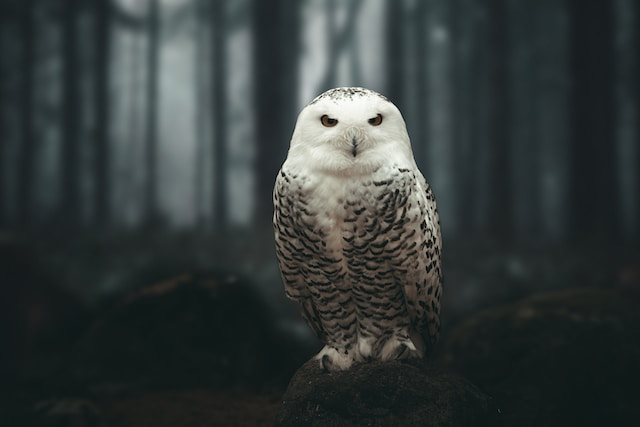

In [70]:
url = "https://unsplash.com/photos/g8oS8-82DxI/download?ixid=MnwxMjA3fDB8MXx0b3BpY3x8SnBnNktpZGwtSGt8fHx8fDJ8fDE2NzgxMDYwODc&force=true&w=640"
image = Image.open(requests.get(url, stream=True).raw)

image

In [71]:
predictions = detector(image, candidate_labels=["fox", "bear", "seagull", "owl"])
predictions

[{'score': 0.9993506073951721, 'label': 'owl'},
 {'score': 0.0004959418438374996, 'label': 'seagull'},
 {'score': 8.070789044722915e-05, 'label': 'fox'},
 {'score': 7.27419537724927e-05, 'label': 'bear'}]

In [72]:
# Defining classes
classes = ["wild boar", "porcupine", "fox", "marten", "hare", "deer", "badger", "wolf", "horse", "dog", "cat", "buzzard", "heron", "mallard", "squirell"]

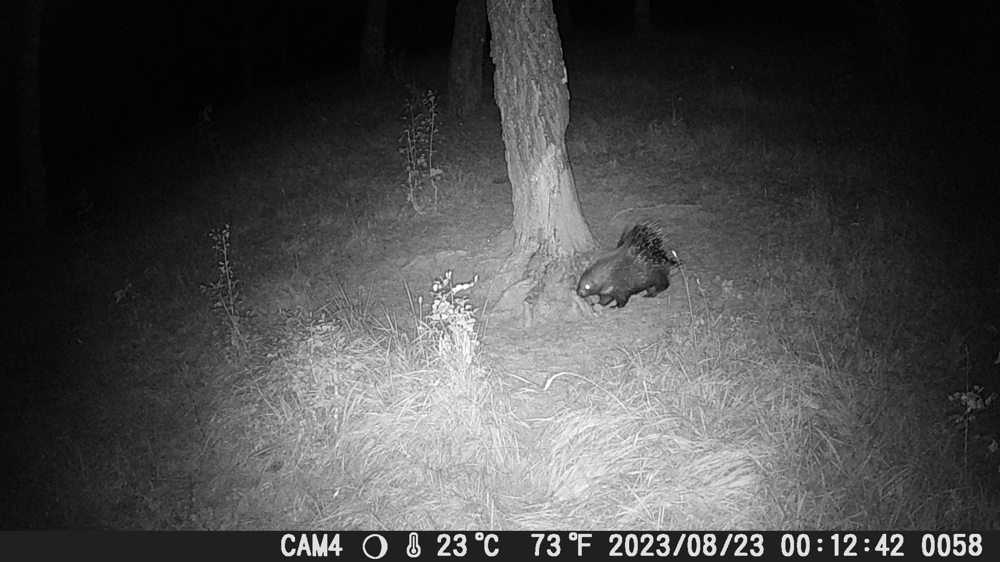

In [73]:
# Let's try with some of our images
image = Image.open("images/aculei-images/TF_ACULEI_16613_DSCF0058.jpg")
# image = Image.open("images/aculei-images/TF_ACULEI_16735_DSCF0359.jpg")
# image = Image.open("images/aculei-images/TF_ACULEI_16698_DSCF0234.jpg")

image

In [74]:
predictions = detector(image, candidate_labels=classes)
predictions

[{'score': 0.9584073424339294, 'label': 'porcupine'},
 {'score': 0.022478658705949783, 'label': 'badger'},
 {'score': 0.009870694018900394, 'label': 'wild boar'},
 {'score': 0.005079389549791813, 'label': 'marten'},
 {'score': 0.003671759506687522, 'label': 'fox'},
 {'score': 0.0002167393104173243, 'label': 'wolf'},
 {'score': 0.00015372957568615675, 'label': 'squirell'},
 {'score': 5.294654692988843e-05, 'label': 'buzzard'},
 {'score': 2.0081146431039087e-05, 'label': 'cat'},
 {'score': 1.708492709440179e-05, 'label': 'dog'},
 {'score': 1.622620584385004e-05, 'label': 'deer'},
 {'score': 6.984790161368437e-06, 'label': 'hare'},
 {'score': 5.380164566304302e-06, 'label': 'mallard'},
 {'score': 2.6206180336885154e-06, 'label': 'horse'},
 {'score': 2.9484172614502313e-07, 'label': 'heron'}]

Let's see some more images to be sure the model performs well

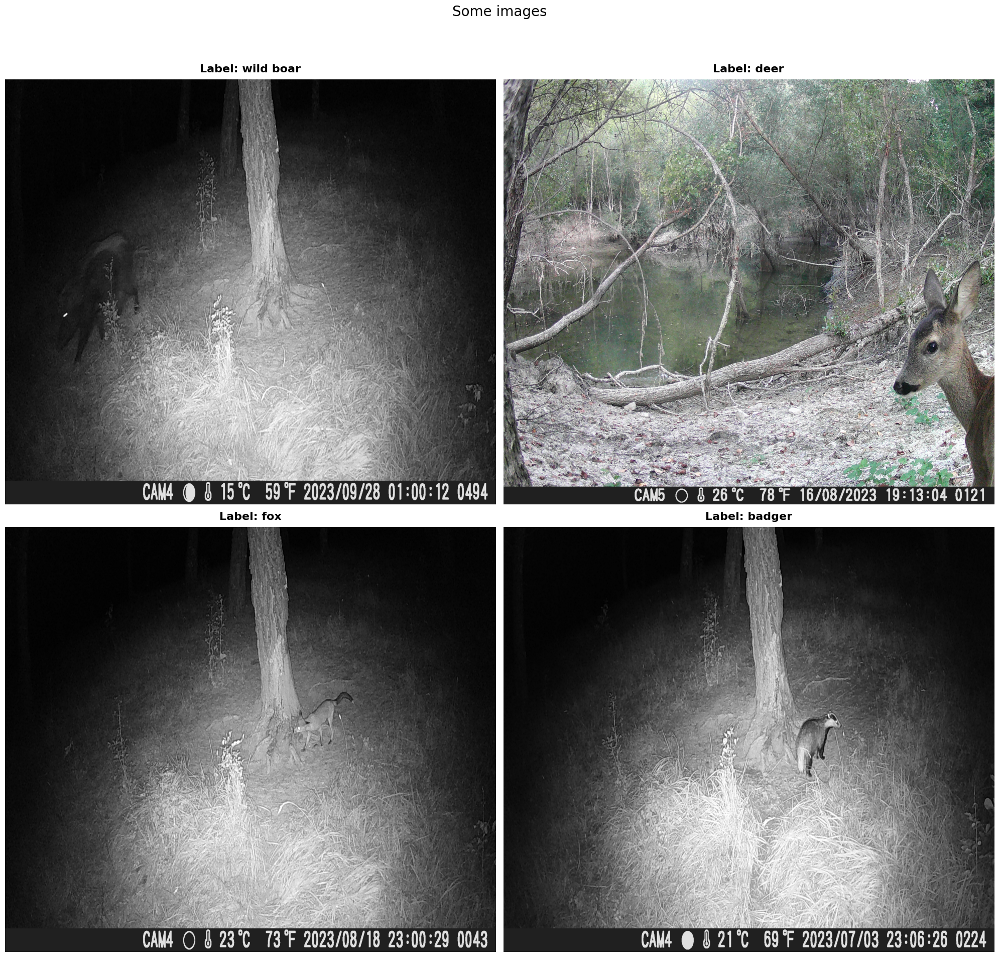

In [75]:
# images_to_test = ["images/aculei-images/TF_ACULEI_16595_DSCF0137.jpg", "images/aculei-images/TF_ACULEI_12307_DSCF0215.jpg", 
#                   "images/aculei-images/TF_ACULEI_15_DSCF0057.jpg", "images/aculei-images/TF_ACULEI_180_IMAG0047.jpg"]

images_to_test = ["images/aculei-images/TF_ACULEI_16770_DSCF0494.jpg", "images/aculei-images/TF_ACULEI_16567_DSCF0121.jpg", 
                  "images/aculei-images/TF_ACULEI_16585_DSCF0043.jpg", "images/aculei-images/TF_ACULEI_16265_DSCF0224.jpg"]

# images_to_test = ["images/aculei-images/TF_ACULEI_16698_DSCF0234.jpg", "images/aculei-images/TF_ACULEI_16697_DSCF0086.jpg",
#                   "images/aculei-images/TF_ACULEI_16691_DSCF0202.jpg", "images/aculei-images/TF_ACULEI_16686_DSCF0056.jpg"]

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))
fig.suptitle('Some images', fontsize=20)

axes = [ax1, ax2, ax3, ax4]
    
for i, ax in enumerate(axes):
    image_path = images_to_test[i]
    image = Image.open(image_path)

    predictions = detector(image, candidate_labels=classes)

    label = predictions[0]['label']
    
    ax.imshow(image, aspect='auto')
    ax.axis('off')

    ax.set_title(f"Label: {label}", fontsize=16, fontweight='bold', pad=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Now we're ready to classify all the images in the dataset and produce a new version of it

In [76]:
images_dir = "images/aculei-images"
datasets_dir = "datasets"

In [77]:
df = pd.read_csv(datasets_dir + "/aculei.csv")

In [78]:
# for index, row in tqdm(df.iterrows(), total=len(df)):
#     image_path = os.path.join(images_dir, row['image_name'])
#     if os.path.isdir(image_path) and image_path.startswith("."):
#         continue 

#     image = Image.open(image_path)
    
#     predictions = detector(image, candidate_labels=classes)
#     label = predictions[0]['label']

#     df.loc[index, 'animal'] = label
    

In [79]:
df.sample(5)

,Unnamed: 0,image_name,camera,date_time,date,time,moon,temp,sha-256
9988,9988,TF_ACULEI_16170_DSCF0715.jpg,5.0,2023-06-22 19:30:54,2023-06-22,19:30:54,Waxing Crescent,28.0,c2b9659bcbb396e0948ebe13c7e41e4db11054f55ed065...
15121,15121,TF_ACULEI_11686_DSCF0135.jpg,4.0,2022-07-25 07:53:50,2022-07-25,07:53:50,Waning Crescent,34.0,790e4dcf6eef4b65f2070a725dbee18218dc889ce2f690...
9141,9141,TF_ACULEI_4538_DSCF4801.jpg,1.0,2021-06-17 23:59:22,2021-06-17,23:59:22,First Quarter,20.0,33367ac89b84286adc3eb33b2ae454f54e88fb0bff1f2b...
14565,14565,TF_ACULEI_5161_DSCF5448.jpg,1.0,2021-06-20 02:35:56,2021-06-20,02:35:56,Waxing Gibbous,20.0,3490a610ac127624924e1f16034e702e033a9a05f2ceee...
707,707,TF_ACULEI_1953_DSCF1929.jpg,1.0,2021-06-07 04:40:23,2021-06-07,04:40:23,Waning Crescent,15.0,feb39bbec5b3eee4f0481cb8ecd928f6cc2673e5c64780...


In [80]:
df.to_pickle(datasets_dir + "/animals.pkl")